# **Descripción del caso de negocio**

La industria aérea se caracteriza por una intensa competencia por lo que resulta de suma importancia conocer a los clientes, sus intereses y preferencias. Este trabajo se centra en analizar los datos de encuestas realizadas a pasajeros de una cierta aerolínea para evaluar distintos aspectos y cómo afectan en el nivel de satisfacción, para esto se utilizarán técnicas de Data Science.

# **Objetivos del modelo**

 El **objetivo general** del presente trabajo es predecir a través de un modelo de Machine Learning la satisfacción con la mayor asertividad posible, según ciertos contextos y analizar qué variables impactan con mayor correlación en la satisfacción, realizando el entrenamiento de un modelo predictivo

Se plantean como **objetivos específicos**: 
* Conocer las características y preferencias de los clientes de acuerdo al género, edad, tipo de cliente y clase de vuelo que utilizan. 
* Identificar cuáles son los servicios que deben mejorarse, y ver si se asocian a las características generales de los clientes 
* Analizar las características generales de los vuelos que tienen mayores inconvenientes (demoras en partida/arribo por ej), y  ver si la información recolectada es de utilidad para proponer soluciones a los mismos. 
* Desarrollar un modelo predictivo que permita identificar el nivel de satisfacción de los pasajeros respecto a los servicios brindados


# **Descripción de los datos**

Los datos se obtuvieron del repositorio www.kaggle.com. Se trata de una base de datos estructurados, generada a partir de encuestas realizadas a más de 100k clientes. La misma cuenta con campos que permiten describir las características generales  del cliente, como género, edad, tipo de viaje, categoría de pasajero, distancia del vuelo; como así también cuáles son las opiniones del mismo en relación a distintos aspectos del viaje. En este punto, utilizando escalas de Likert, se les consultó sobre distintos aspectos con el grado de satisfacción donde : 0 correspondía a variables donde la respuesta No Aplica, y los puntajes de 1 a 5 indican el nivel de  satisfacción de los pasajeros.

* Gender: Género de los pasajeros (variable categórica, “Female /Male”)
* Customer Type: tipo de cliente, categorizado como: “cliente leal” / “cliente desleal”) (Loyal customer, disloyal customer)
* Age: Edad actual de los pasajeros (variable numérica, en años)
* Type of Travel: Motivo del viaje de los pasajeros (variable categórica: Personal Travel /  Business Travel)
* Class: Tipo de clase en la que viajaban los pasajeros (variable categórica: Business / Eco / Eco Plus)
* Flight distance: Distancia recorrida en el viaje (variable numérica, en kilómetros)
* Inflight wifi service: Nivel de satisfacción respecto al servicio de wifi durante el vuelo (escala de likert) ( 
* Departure/Arrival time convenient: Nivel de satisfacción en relación a la conveniencia entre el tiempo de partida/arribo  (escala de likert)
* Ease of Online booking: Nivel de satisfacción respecto a la reserva online (escala de likert)
* Gate location: Nivel de satisfacción respecto a la ubicación de la puerta de embarque en el aeropuerto  (escala de likert)
* Food and drink: Nivel de satisfacción respecto a la comida y bebida (escala de likert)
* Online boarding: Nivel de satisfacción respecto a Satisfaction level of online boarding (escala de likert)
* Seat comfort: Nivel de satisfacción respecto a la comodidad de los asientos (escala de likert)
* Inflight entertainment: Nivel de satisfacción respecto al entretenimiento durante el vuelo (escala de likert)
* On-board service: Nivel de satisfacción respecto al servicio durante el vuelo (escala de likert)
* Leg room service: Nivel de satisfacción respecto al servicio de espacios para piernas Satisfaction level of Leg room service (escala de likert)
* Baggage handling: Nivel de satisfacción respecto al manejo del equipaje (escala de likert)
* Check-in service: Nivel de satisfacción respecto al servicio de check-in (escala de likert)
* Inflight service: Nivel de satisfacción respecto al servicio durante el vuelo (escala de likert)
* Cleanliness: Nivel de satisfacción respecto a la limpieza (escala de likert)
* Departure Delay in Minutes: minutos de demora en la partida  (variable numérica, en minutos)
* Arrival Delay in Minutes: minutos de demora en el arribo  (variable numérica, en minutos)
* Satisfaction: Nivel de satisfacción respecto a la aerolínea en general, medido como “satisfactorio” o “neutral / no satisfactorio”. 

# **Data Wrangling y EDA**

**Paquetes Numpy, Pandas, Matplotlib, Seaborn, Letsplot y Sklearn**

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
#Import Request 
import io
import requests
url_train = "https://github.com/jonezequiel92/Airline-Passenger-Satisfaction/raw/main/train.csv"
url_test = "https://github.com/jonezequiel92/Airline-Passenger-Satisfaction/raw/main/test.csv"
s_train=requests.get(url_train).content
s_test=requests.get(url_test).content
df_train=pd.read_csv(io.StringIO(s_train.decode('utf-8')))
df_test=pd.read_csv(io.StringIO(s_test.decode('utf-8')))

**Set Option**

In [ ]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [ ]:
print(df_train.shape)
print(df_test.shape)

(103904, 25)
(25976, 25)


**Modelado de Datos**

In [ ]:
df = pd.concat([df_train,df_test])
df.reset_index(inplace=True,drop=True)
df.head()

,Unnamed: 0,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.000,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.000,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.000,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.000,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.000,satisfied


In [ ]:
# se eliminan columnas que no son de interés
df.drop(['Unnamed: 0','id'],axis=1,inplace=True)

In [ ]:
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18.000,neutral or dissatisfied
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6.000,neutral or dissatisfied
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0.000,satisfied
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9.000,neutral or dissatisfied
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0.000,satisfied


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Gender                             129880 non-null  object 
 1   Customer Type                      129880 non-null  object 
 2   Age                                129880 non-null  int64  
 3   Type of Travel                     129880 non-null  object 
 4   Class                              129880 non-null  object 
 5   Flight Distance                    129880 non-null  int64  
 6   Inflight wifi service              129880 non-null  int64  
 7   Departure/Arrival time convenient  129880 non-null  int64  
 8   Ease of Online booking             129880 non-null  int64  
 9   Gate location                      129880 non-null  int64  
 10  Food and drink                     129880 non-null  int64  
 11  Online boarding                    1298

In [ ]:
# 393 valores nulos en Arrival Delay in Minutes   
df.isnull().sum()

Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             393
satisfaction                           0
dtype: int64

In [ ]:
# al ser pocos valores nulos, 393 en 129880 registros se eliminan. 
df.dropna(inplace=True)
df.reset_index(inplace=True,drop=True)

In [ ]:
# se modifica el tipo de dato de Arrival Delay in Minutes de decimal a entero
df['Arrival Delay in Minutes'] = df['Arrival Delay in Minutes'].astype('int64')

In [ ]:
#Se constata la ausencia de Valores faltantes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129487 entries, 0 to 129486
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   Gender                             129487 non-null  object
 1   Customer Type                      129487 non-null  object
 2   Age                                129487 non-null  int64 
 3   Type of Travel                     129487 non-null  object
 4   Class                              129487 non-null  object
 5   Flight Distance                    129487 non-null  int64 
 6   Inflight wifi service              129487 non-null  int64 
 7   Departure/Arrival time convenient  129487 non-null  int64 
 8   Ease of Online booking             129487 non-null  int64 
 9   Gate location                      129487 non-null  int64 
 10  Food and drink                     129487 non-null  int64 
 11  Online boarding                    129487 non-null  

In [ ]:
# variables categóricas
df.dtypes[df.dtypes == 'object']

Gender            object
Customer Type     object
Type of Travel    object
Class             object
satisfaction      object
dtype: object

In [ ]:
# valores únicos en las variables categóricas 
for i in df.dtypes[df.dtypes=='object'].index:
  print(i)
  print(df[i].unique())


Gender
['Male' 'Female']
Customer Type
['Loyal Customer' 'disloyal Customer']
Type of Travel
['Personal Travel' 'Business travel']
Class
['Eco Plus' 'Business' 'Eco']
satisfaction
['neutral or dissatisfied' 'satisfied']


In [ ]:
# crear dummies para las variables categóricas 
df['transformed_Gender'] = df['Gender'].map({'Male':1,'Female':0})
df['transformed_Customer Type'] = df['Customer Type'].map({'Loyal Customer':1,'disloyal Customer':0})
df['transformed_Type of Travel'] = df['Type of Travel'].map({'Business travel':1,'Personal Travel':0})
df['transformed_Class'] = df['Class'].map({'Business':2,'Eco Plus':1,'Eco':0})
df['transformed_satisfaction'] = df['satisfaction'].map({'satisfied':1,'neutral or dissatisfied':0})


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129487 entries, 0 to 129486
Data columns (total 28 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   Gender                             129487 non-null  object
 1   Customer Type                      129487 non-null  object
 2   Age                                129487 non-null  int64 
 3   Type of Travel                     129487 non-null  object
 4   Class                              129487 non-null  object
 5   Flight Distance                    129487 non-null  int64 
 6   Inflight wifi service              129487 non-null  int64 
 7   Departure/Arrival time convenient  129487 non-null  int64 
 8   Ease of Online booking             129487 non-null  int64 
 9   Gate location                      129487 non-null  int64 
 10  Food and drink                     129487 non-null  int64 
 11  Online boarding                    129487 non-null  

**Métrica, Funciones y Gráficos**

In [ ]:
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,transformed_Gender,transformed_Customer Type,transformed_Type of Travel,transformed_Class,transformed_satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied,1,1,0,1,0
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied,1,0,1,2,0
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied,0,1,1,2,1
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied,0,1,1,2,0
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied,1,1,1,2,1


In [ ]:
df.shape

(129487, 28)

In [ ]:
df.describe().T[:-5]

,count,mean,std,min,25%,50%,75%,max
Age,129487.000,39.429,15.118,7.000,27.000,40.000,51.000,85.000
Flight Distance,129487.000,1190.211,997.561,31.000,414.000,844.000,1744.000,4983.000
Inflight wifi service,129487.000,2.729,1.329,0.000,2.000,3.000,4.000,5.000
Departure/Arrival time convenient,129487.000,3.057,1.527,0.000,2.000,3.000,4.000,5.000
Ease of Online booking,129487.000,2.757,1.402,0.000,2.000,3.000,4.000,5.000
Gate location,129487.000,2.977,1.279,0.000,2.000,3.000,4.000,5.000
Food and drink,129487.000,3.205,1.330,0.000,2.000,3.000,4.000,5.000
Online boarding,129487.000,3.253,1.351,0.000,2.000,3.000,4.000,5.000
Seat comfort,129487.000,3.442,1.319,0.000,2.000,4.000,5.000,5.000
Inflight entertainment,129487.000,3.358,1.334,0.000,2.000,4.000,4.000,5.000


# Gráficos

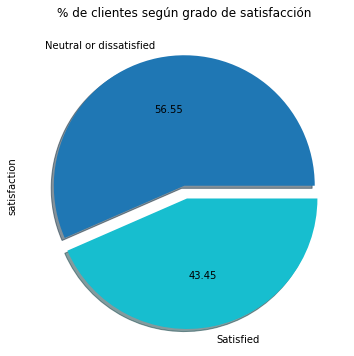

In [ ]:
#Gráfico de Satisfación
plt.figure(figsize=(6,6))
labels = 'Neutral or dissatisfied', 'Satisfied'
explode = (0, 0.1)

df_group = df.satisfaction.value_counts(normalize=True).mul(100)
df_group.plot.pie(autopct="%.2f", cmap='tab10', labels=labels,explode=explode ,shadow=True).set(title='% de clientes según grado de satisfacción')

plt.show()

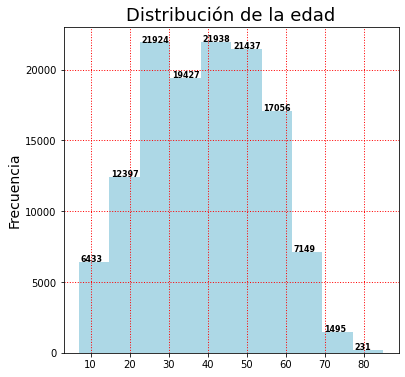

In [ ]:
#Gráfico Univariado
plt.figure(figsize=(6,6))
v,m,g=plt.hist(df['Age'], color='lightblue')
plt.title("Distribución de la edad",size=18)
plt.ylabel("Frecuencia",size=14)
for i, rect in enumerate(g):
    posx = rect.get_x()
    posy = rect.get_height()
    plt.text(posx+0.5, posy + 30, int(v[i]), color='black', fontsize = 8,weight='bold')
plt.grid(color='r', linestyle='dotted', linewidth=1)
plt.show()

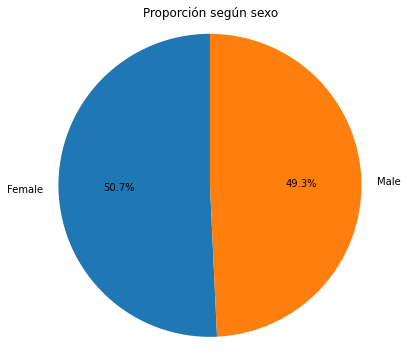

In [ ]:
# grafico para la conclusion 'La proporción de hombres y mujeres encuestados es similar.'
gender_perc = df.Gender.value_counts(normalize=True).mul(100)

fig, ax = plt.subplots(figsize=(6,6))
ax.pie(gender_perc, labels=gender_perc.index, autopct='%1.1f%%', startangle=90)
ax.axis('equal')  
plt.title("Proporción según sexo",size=12)

plt.show()

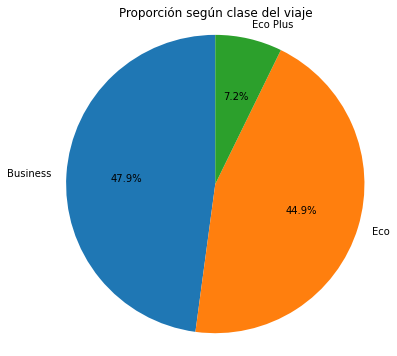

In [ ]:
class_perc = df['Class'].value_counts(normalize=True).mul(100)

fig, ax = plt.subplots(figsize=(6,6))
ax.pie(class_perc, labels=class_perc.index, autopct='%1.1f%%', startangle=90)
ax.axis('equal')  
plt.title("Proporción según clase del viaje",size=12)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


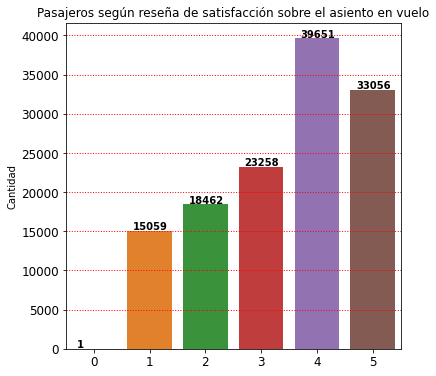

In [ ]:
#Confort de los Asientos 
from seaborn import countplot
plt.figure(figsize=(6,6))
ax = countplot(df['Seat comfort'], data=df)
plt.xticks(size =12)
plt.yticks(size =12)
plt.ylabel('Cantidad')
ax.set(xlabel=None)
abs_values = df['Seat comfort'].value_counts(ascending=False).values
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+120),weight='bold')
plt.title("Pasajeros según reseña de satisfacción sobre el asiento en vuelo",size=12)
plt.grid(color='r', linestyle='dotted', linewidth=1,axis='y')
plt.show()

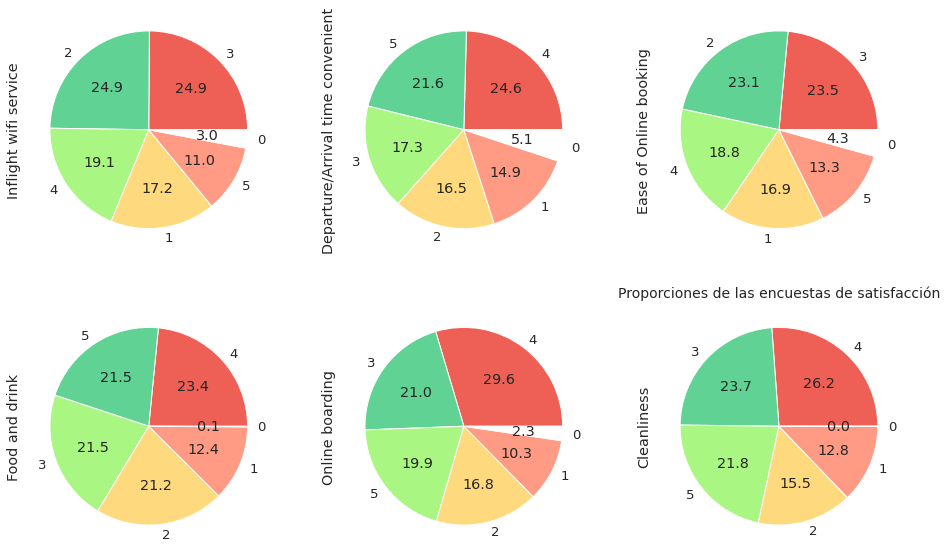

In [ ]:
list_poll=['Inflight wifi service','Departure/Arrival time convenient','Ease of Online booking','Food and drink','Online boarding','Cleanliness']
colores = ["#EE6055","#60D394","#AAF683","#FFD97D","#FF9B85","#FFFFFF"]
fig, axarr = plt.subplots(2, 3, figsize=(16, 10))
for index,i in enumerate(list_poll):
  df[i].value_counts().plot.pie(autopct="%.1f",colors=colores,ax=axarr[int(index/3)][index%3])
sns.set(font_scale = 1.2)
plt.title('Proporciones de las encuestas de satisfacción', fontsize = 14, fontweight = 20)
plt.show()


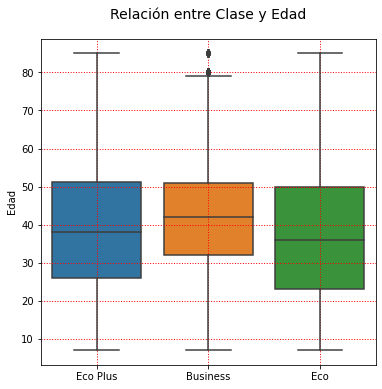

In [ ]:
#Relación entre Clase y Edad
fig, ax = plt.subplots(figsize=(6,6))
ax = sns.boxplot(x=df['Class'], y=df['Age'])
ax.set_title('Relación entre Clase y Edad', {'fontsize':14},pad=20)
ax.set(xlabel=None)
ax.set_ylabel('Edad')
plt.grid(color='r', linestyle='dotted', linewidth=1)
plt.show()

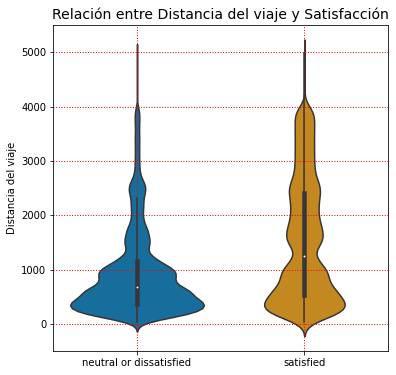

In [ ]:
#Relación entre distancia de viaje y satisfacción
plt.figure(figsize=(6,6))
sns.violinplot(x='satisfaction', y='Flight Distance',data=df, palette = 'colorblind')
plt.title('Relación entre Distancia del viaje y Satisfacción', fontsize = 14, fontweight = 30)
plt.ylabel('Distancia del viaje')
plt.xlabel('')
plt.grid(color='r', linestyle='dotted', linewidth=1)
plt.show()

In [ ]:
pd.crosstab(df.Class, df.satisfaction)

satisfaction,neutral or dissatisfied,satisfied
Class,,
Business,18940,43050
Eco,47215,10902
Eco Plus,7070,2310


In [ ]:
pd.crosstab(df['Type of Travel'], df.satisfaction)

satisfaction,neutral or dissatisfied,satisfied
Type of Travel,,
Business travel,37238,52207
Personal Travel,35987,4055


In [ ]:
df.groupby('Type of Travel')['Flight Distance'].describe()

,count,mean,std,min,25%,50%,75%,max
Type of Travel,,,,,,,,
Business travel,71655.00,1368.29,1086.68,31.00,451.00,986.00,2143.00,4983.00
Personal Travel,32249.00,792.08,592.27,31.00,363.00,628.00,1023.00,4983.00


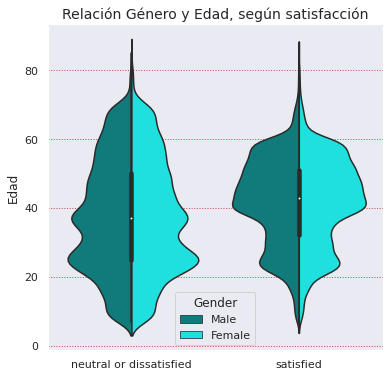

In [ ]:
#Gráfico Multivariado
sns.set(font_scale = 1)
plt.figure(figsize=(6,6))
sns.violinplot(x="satisfaction", y="Age", hue="Gender",
               data=df, 
               palette=['#008B8B','#00FFFF'],
               split=True,
               scale="count")
plt.title('Relación Género y Edad, según satisfacción', fontsize = 14, fontweight = 20)
plt.xlabel('')
plt.ylabel('Edad')
plt.grid(color='r', linestyle='dotted', linewidth=1,axis='y')
plt.show()

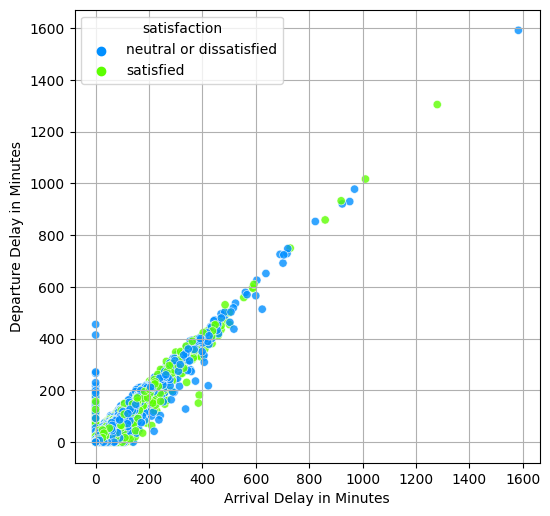

In [ ]:
#Relación entre los tiempos de espera y la satisfacción 
plt.figure(figsize=(6,6))

sns.scatterplot(data=df, x='Arrival Delay in Minutes',y='Departure Delay in Minutes',hue='satisfaction',palette='gist_rainbow_r', alpha=0.8)

plt.grid() # agregar una grilla

plt.show()

In [ ]:
#Gráfico Multivariado
fig = px.violin(df, y="Flight Distance", x="Class", color="satisfaction", box=True,hover_data=df.columns)
fig.show()


/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:337: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


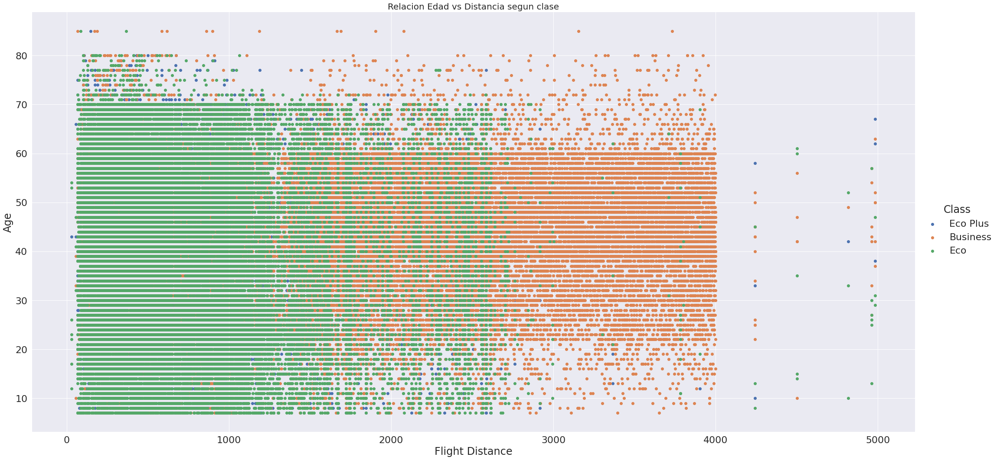

In [ ]:
#FacetGrid - Edad vs Distancia segun clase

sns.FacetGrid(df,hue = 'Class',height=1.5, aspect=2,size=15).map(plt.scatter,'Flight Distance','Age').add_legend();
sns.set(font_scale = 2)
plt.title('Relacion Edad vs Distancia segun clase', fontsize = 20, fontweight = 30)
plt.show()

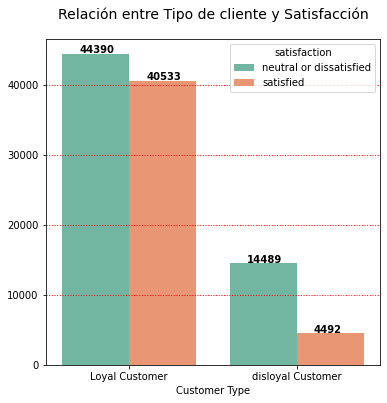

In [ ]:
#Satisfación según tipo de Cliente

fig, ax = plt.subplots(figsize=(6,6))
ax = sns.countplot(x = 'Customer Type', palette = "Set2", data = df, hue='satisfaction' ) 
ax.set_title('Relación entre Tipo de cliente y Satisfacción', {'fontsize':14},pad=20)
ax.set(ylabel=None)
for p in ax.patches:
   ax.annotate('{:.0f}'.format(p.get_height()), (p.get_x()+0.1, p.get_height()+120),weight='bold')
plt.grid(color='r', linestyle='dotted', linewidth=1,axis='y')
plt.show()

In [ ]:
# promedio de indicadores según clase y satisfacción
grouped_dataclass = df.groupby(
                  ['satisfaction','Class']).mean()[
                  ['Inflight wifi service', 'Ease of Online booking', 'Food and drink', 
                   'Seat comfort', 'Inflight entertainment', 'On-board service','Inflight service','Cleanliness' ]]
grouped_dataclass                

Inflight wifi service  \
satisfaction            Class                             
neutral or dissatisfied Business                   2.39   
                        Eco                        2.40   
                        Eco Plus                   2.40   
satisfied               Business                   2.94   
                        Eco                        3.87   
                        Eco Plus                   3.88   

                                  Ease of Online booking  Food and drink  \
satisfaction            Class                                              
neutral or dissatisfied Business                    2.76            2.88   
                        Eco                         2.46            2.99   
                        Eco Plus                    2.56            2.92   
satisfied               Business                    2.98            3.52   
                        Eco                         3.24            3.49   
                        Eco Plus                    2.98            3.73   

                                  Seat comfort  Inflight entertainment  \
satisfaction            Class                                            
neutral or dissatisfied Business          2.99                    2.68   
                        Eco               3.06                    2.98   
                        Eco Plus          3.01                    2.89   
satisfied               Business          4.10                    4.06   
                        Eco               3.49                    3.62   
                        Eco Plus          3.72                    3.92   

                                  On-board service  Inflight service  \
satisfaction            Class                                          
neutral or dissatisfied Business              2.89              3.20   
                        Eco                   3.07              3.46   
                        Eco Plus              2.99              3.41   
satisfied               Business              4.03              4.13   
                        Eco                   3.32              3.48   
                        Eco Plus              3.23              3.32   

                                  Cleanliness  
satisfaction            Class                  
neutral or dissatisfied Business         2.72  
                        Eco              3.02  
                        Eco Plus         2.93  
satisfied               Business         3.81  
                        Eco              3.49  
                        Eco Plus         3.73

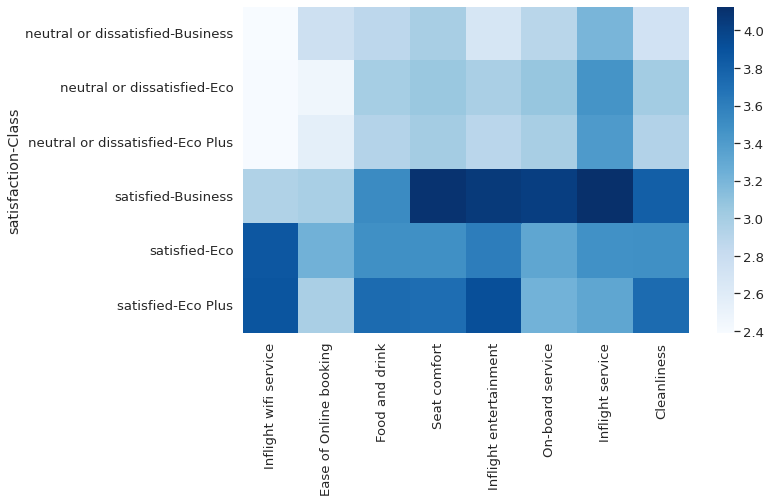

In [ ]:
fig, axarr = plt.subplots(figsize=(10, 6))
sns.heatmap(grouped_dataclass, cmap='Blues')
plt.show()

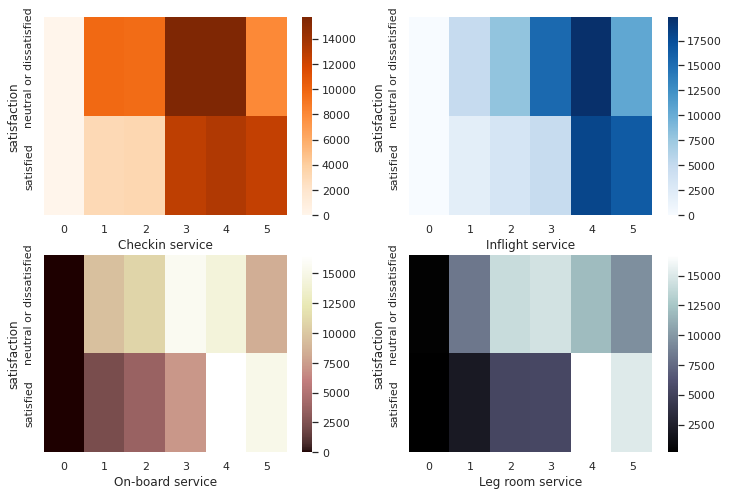

In [ ]:
# Checkin Service, Inflight Service, On-board Service, Leg-room Service
list_service_color=[['Checkin service','Oranges'],['Inflight service','Blues'],['On-board service','pink'],['Leg room service','bone']]
#lista para iterar y hacer grafico de calor
fig, axarr = plt.subplots(2, 2, figsize=(12, 8))
for index,i in enumerate(list_service_color):
  servicio,color=i
  sns.heatmap(pd.crosstab(df['satisfaction'], df[servicio]), cmap=color, ax = axarr[int(index/2)][index%2])


#Entrenamiento de Modelos

## Data Preprocessing

In [ ]:
df.head()

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction,transformed_Gender,transformed_Customer Type,transformed_Type of Travel,transformed_Class,transformed_satisfaction
0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,neutral or dissatisfied,1,1,0,1,0
1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,neutral or dissatisfied,1,0,1,2,0
2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,satisfied,0,1,1,2,1
3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,neutral or dissatisfied,0,1,1,2,0
4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,satisfied,1,1,1,2,1


Se eliminan columnas categóricas sin transformación

In [ ]:
columnas_a_eliminar = ['Gender','Customer Type','Type of Travel','Class','satisfaction']

df.drop(columns=columnas_a_eliminar,inplace=True)

Se eliminan registros con valor 0 (cero) que significa (no responde/no aplica) en indicadores de satisfacción

In [ ]:
columnas_indicadores = ['Inflight wifi service',
'Departure/Arrival time convenient', 'Ease of Online booking',
'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
'Inflight entertainment', 'On-board service', 'Leg room service',
'Baggage handling', 'Checkin service', 'Inflight service',
'Cleanliness']

In [ ]:
# contamos registros con 0 (no responde/no aplica) en cada indicador de satisfacción 
for i in columnas_indicadores:
  print(i)
  print(len(df[df[i] == 0]))

Inflight wifi service
3908
Departure/Arrival time convenient
6664
Ease of Online booking
5666
Gate location
1
Food and drink
130
Online boarding
3071
Seat comfort
1
Inflight entertainment
18
On-board service
5
Leg room service
596
Baggage handling
0
Checkin service
1
Inflight service
5
Cleanliness
14


In [ ]:
# contamos cuanto aparece (en porcentaje) cada valor en cada indicador de satisfacción
for i in columnas_indicadores:
  print(f'{i} (%)')
  valores = round(df[i].value_counts(normalize=True).mul(100).sort_values()).astype('int')
  print(valores.to_string())

Inflight wifi service (%)
0     3
5    11
1    17
4    19
3    25
2    25
Departure/Arrival time convenient (%)
0     5
1    15
2    17
3    17
5    22
4    25
Ease of Online booking (%)
0     4
5    13
1    17
4    19
2    23
3    23
Gate location (%)
0     0
5    13
1    17
2    19
4    23
3    28
Food and drink (%)
0     0
1    12
2    21
3    21
5    22
4    24
Online boarding (%)
0     2
1    10
2    17
5    20
3    21
4    30
Seat comfort (%)
0     0
1    12
2    14
3    18
5    26
4    31
Inflight entertainment (%)
0     0
1    12
2    17
3    18
5    24
4    28
On-board service (%)
0     0
1    11
2    14
3    22
5    23
4    30
Leg room service (%)
0     0
1    10
2    19
3    19
5    24
4    28
Baggage handling (%)
1     7
2    11
3    20
5    26
4    36
Checkin service (%)
0     0
2    12
1    12
5    20
3    27
4    28
Inflight service (%)
0     0
1     7
2    11
3    19
5    26
4    36
Cleanliness (%)
0     0
1    13
2    15
5    22
3    24
4    26


In [ ]:
# eliminamos registros con 0 (no responde/no aplica) en los indicadores de satisfacción 
print(f'Tamaño del dataframe original: {df.shape}')  
for i in columnas_indicadores:
  df = df[df[i] != 0]
print(f'Tamaño del dataframe: {df.shape}')  

Tamaño del dataframe original: (129487, 23)
Tamaño del dataframe: (119204, 23)


In [ ]:
# Se verifica que no hay registros con 0 (no responde/no aplica) en cada indicador de satisfacción 
for i in columnas_indicadores:
  print(i)
  print(len(df[df[i] == 0]))

Inflight wifi service
0
Departure/Arrival time convenient
0
Ease of Online booking
0
Gate location
0
Food and drink
0
Online boarding
0
Seat comfort
0
Inflight entertainment
0
On-board service
0
Leg room service
0
Baggage handling
0
Checkin service
0
Inflight service
0
Cleanliness
0


In [ ]:
# backup del dataframe ya realizado data wrangling
df.to_csv('passenger-satisfaction-dataset-clean.csv',index=False)

In [ ]:
df = pd.read_csv('/content/passenger-satisfaction-dataset-clean.csv')

In [ ]:
df.head()

,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,transformed_Gender,transformed_Customer Type,transformed_Type of Travel,transformed_Class,transformed_satisfaction
0,13,460,3,4,3,1,5,3,5,5,4,3,4,4,5,5,25,18,1,1,0,1,0
1,25,235,3,2,3,3,1,3,1,1,1,5,3,1,4,1,1,6,1,0,1,2,0
2,26,1142,2,2,2,2,5,5,5,5,4,3,4,4,4,5,0,0,0,1,1,2,1
3,25,562,2,5,5,5,2,2,2,2,2,5,3,1,4,2,11,9,0,1,1,2,0
4,61,214,3,3,3,3,4,5,5,3,3,4,4,3,3,3,0,0,1,1,1,2,1


In [ ]:
# Separo los features y target 
X = df.drop('transformed_satisfaction', axis=1) #Elimino la variable a predecir
y = df['transformed_satisfaction'] #Defino el Target

In [ ]:
!pip install lightgbm

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold, validation_curve, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier 
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb 
from sklearn.metrics import roc_auc_score, accuracy_score, ConfusionMatrixDisplay, classification_report, RocCurveDisplay, roc_curve, precision_recall_curve
import warnings
import time
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)
from sklearn.feature_selection import VarianceThreshold, SelectKBest, chi2, SelectFromModel

## **Normalización de las variables**

In [ ]:
scaler = StandardScaler()
X_normalized = scaler.fit_transform(X)

In [ ]:
#Me quedo con 30% para test y 70% para train
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y, test_size=0.3, random_state=42) 

#### Correlaciones


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  This is separate from the ipykernel package so we can avoid doing imports until


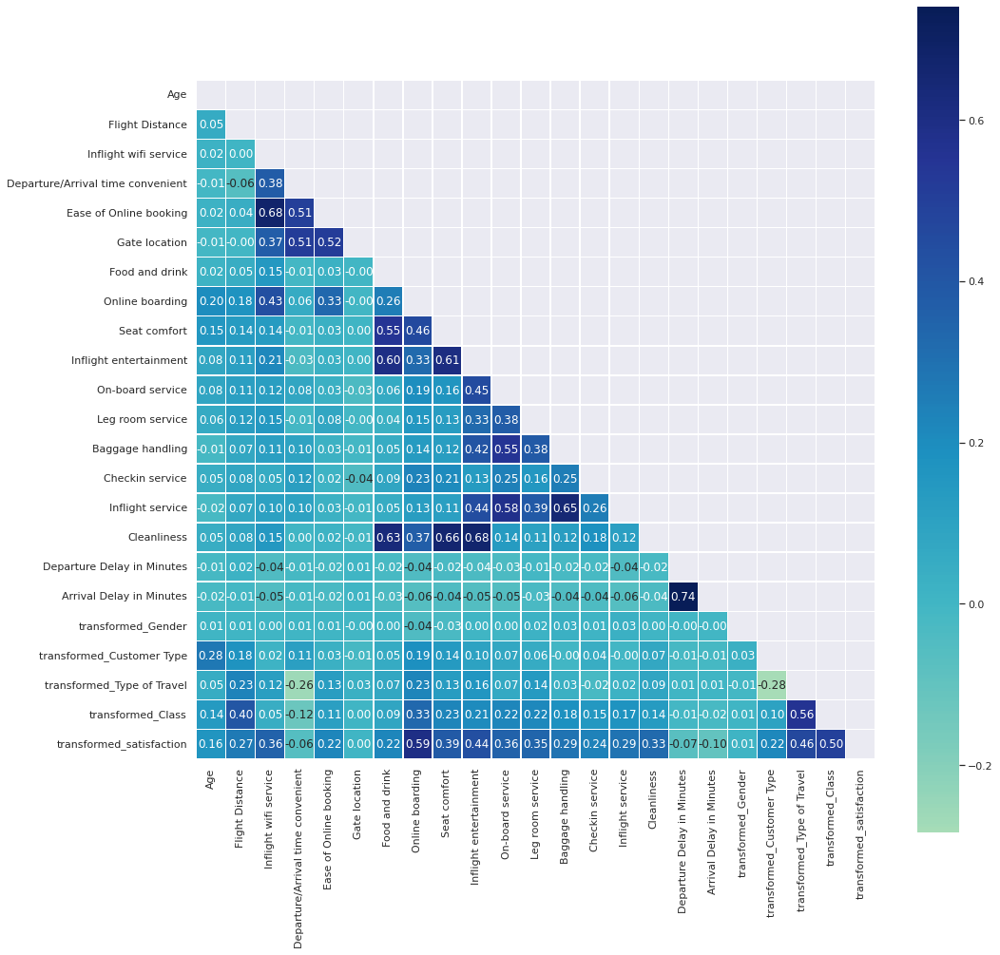

In [ ]:
corr = df.corr(method='spearman')
# Máscara para ocultar valores repetidos
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 16))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot = True, mask=mask, cmap="YlGnBu", center=0,
            square=True, linewidths=.5, fmt='.2f')

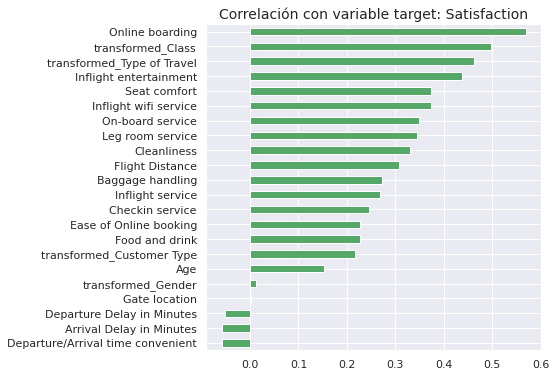

In [ ]:
plt.figure(figsize=(6,6))
df.corr().iloc[:-1,-1].sort_values().plot(kind='barh',color='g')
plt.title('Correlación con variable target: Satisfaction',size=14)
plt.show()

De acuerdo a nuestro gráfico de correlación, observamos que aquellas variables que explican en mayor medida la satisfación de nuestros clientes corresponden a 



1.   Online Boarding
2.   Class
3.   Type of Travel

Mientras aquellas que peor correlación tienen con nuestra variable de satisfacción son: 



*   Gate Location
*   Gender
*   Departure/Arrival Time Conveninet





## Evaluación de modelos 

### Decision Tree

Accuracy = 0.9484089256752978
ROC Area bajo la Curva = 0.9475519760897532
Tiempo de Ejecución = 0.6076035499572754
              precision    recall  f1-score   support

           0    0.95692   0.95324   0.95508     20574
           1    0.93699   0.94186   0.93942     15188

    accuracy                        0.94841     35762
   macro avg    0.94695   0.94755   0.94725     35762
weighted avg    0.94845   0.94841   0.94843     35762



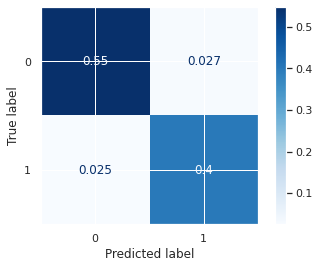

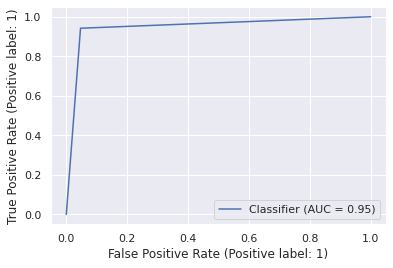

In [ ]:
# creamos modelo base con settings default
model = DecisionTreeClassifier(random_state = 42,class_weight='balanced') 
# default
# 'criterion': 'gini',
# 'max_depth': None,
# 'min_samples_leaf': 1,
# 'min_samples_split': 2,

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test) 
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken_dt = time.time()-t0
accuracy_dt = accuracy_score(y_test, y_pred)
roc_auc_dt = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy_dt))
print("ROC Area bajo la Curva = {}".format(roc_auc_dt))
print("Tiempo de Ejecución = {}".format(time_taken_dt))
print(classification_report(y_test,y_pred,digits=5))
# guardo valores roc curve y precision-recall curve
fpr_dt,tpr_dt,thresholds = roc_curve(y_test, y_probs)
precision_dt,recall_dt,thresh = precision_recall_curve(y_test, y_probs)
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

In [ ]:
model.get_params()

{'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 42,
 'splitter': 'best'}

### Decision Tree - Hyperparameter Tuning

GridSearch

In [ ]:
params_dt = {'criterion':['gini','entropy'],
             'max_depth':np.arange(1,20),
             'min_samples_split':np.arange(1,5),
             'min_samples_leaf':np.arange(1,5)}

model = DecisionTreeClassifier(random_state=42,class_weight='balanced')
grid_search = GridSearchCV(model, params_dt, cv=3)
grid_search.fit(X_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:372: FitFailedWarning: 
456 fits failed out of a total of 1824.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
456 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py", line 942, in fit
    X_idx_sorted=X_idx_sorted,
  File "/usr/local/lib/python3.7/dist-packages/sklearn/tree/_classes.py", line 254, in fit
    % self.min_samples_split
ValueError: min_samples_split must be an integer greater than 1 or a flo

GridSearchCV(cv=3,
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19]),
                         'min_samples_leaf': array([1, 2, 3, 4]),
                         'min_samples_split': array([1, 2, 3, 4])})

In [ ]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 16,
 'min_samples_leaf': 1,
 'min_samples_split': 2}

In [ ]:
grid_search.best_estimator_

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=16, random_state=42)

In [ ]:
# best 5 estimators 
grid_scores = pd.DataFrame(grid_search.cv_results_)
print(f'Estimadores intentados: {len(grid_scores)}')
print('TOP 5 estimadores')
grid_scores[['rank_test_score','mean_test_score', 'std_test_score','param_max_depth','param_criterion','param_min_samples_split','param_min_samples_leaf','mean_fit_time','std_fit_time']].sort_values('rank_test_score').head()



Estimadores intentados: 608
TOP 5 estimadores


,rank_test_score,mean_test_score,std_test_score,param_max_depth,param_criterion,param_min_samples_split,param_min_samples_leaf,mean_fit_time,std_fit_time
545,1,0.949,0.000,16,entropy,2,1,0.309,0.006
577,2,0.949,0.000,18,entropy,2,1,0.321,0.004
579,3,0.949,0.001,18,entropy,4,1,0.320,0.010
553,4,0.949,0.000,16,entropy,2,3,0.300,0.005
554,4,0.949,0.000,16,entropy,3,3,0.301,0.001


Sensibilidad accuracy con max_depth

In [ ]:
param_range= np.arange(1,30)

model = DecisionTreeClassifier(class_weight='balanced', criterion='entropy', random_state=42)

train_scores, test_scores = validation_curve(model, X_train, y_train, 
                                              param_name='max_depth',
                                              param_range=param_range,cv=3)


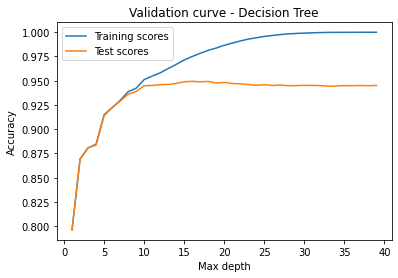

In [ ]:
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(6,6))
plt.plot(param_range,train_scores_mean,label='Training scores')
plt.plot(param_range,test_scores_mean,label='Test scores')

plt.title('Validation curve - Decision Tree')
plt.ylabel('Accuracy')
plt.xlabel('Max depth')
plt.legend()
plt.show()

Vemos que a partir de un max_depth de 10 el accuracy del modelo mejora marginalmente y a partir de 15/16 comienza a empeorar la performance

Elegimos el estimador en base a los resultados del GridSearch

Accuracy = 0.9531066495162462
ROC Area bajo la Curva = 0.977873386455552
Tiempo de Ejecución = 0.7934095859527588
              precision    recall  f1-score   support

           0    0.95989   0.95854   0.95922     20574
           1    0.94394   0.94575   0.94484     15188

    accuracy                        0.95311     35762
   macro avg    0.95192   0.95214   0.95203     35762
weighted avg    0.95312   0.95311   0.95311     35762



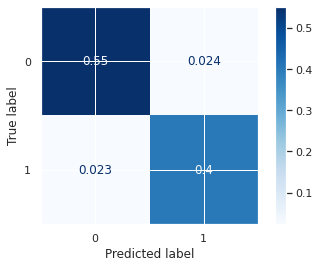

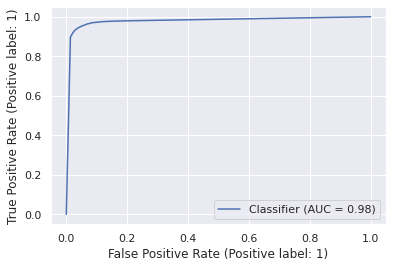

In [ ]:
model = DecisionTreeClassifier(class_weight='balanced', criterion='entropy', 
                               max_depth=16, random_state=42)

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken_dt_best = time.time()-t0
accuracy_dt_best = accuracy_score(y_test, y_pred)
roc_auc_dt_best = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy_dt_best))
print("ROC Area bajo la Curva = {}".format(roc_auc_dt_best))
print("Tiempo de Ejecución = {}".format(time_taken_dt_best))
print(classification_report(y_test,y_pred,digits=5))
# guardo valores roc curve y precision-recall curve
fpr_dt_best,tpr_dt_best,thresholds = roc_curve(y_test, y_probs)
precision_dt_best,recall_dt_best,thresh = precision_recall_curve(y_test, y_probs)
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

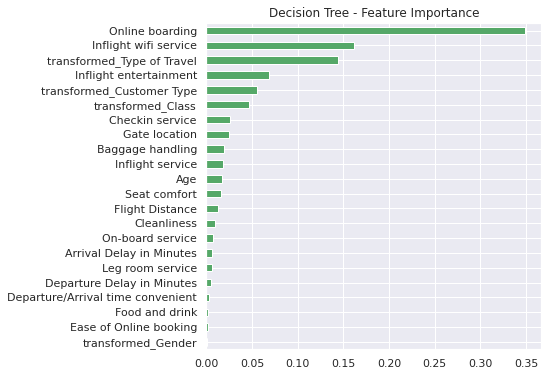

In [ ]:
# importancia de features 
plt.figure(figsize=(6,6))
pd.Series(model.feature_importances_,index=X.columns).sort_values().plot(kind='barh',color='g')
plt.title('Decision Tree - Feature Importance')
plt.show()

### Random Forest

Accuracy = 0.9629494994687098
ROC Area bajo la Curva = 0.9939333439990472
Tiempo de Ejecución = 10.66377305984497
              precision    recall  f1-score   support

           0    0.95664   0.98002   0.96819     20574
           1    0.97201   0.93982   0.95565     15188

    accuracy                        0.96295     35762
   macro avg    0.96432   0.95992   0.96192     35762
weighted avg    0.96317   0.96295   0.96286     35762



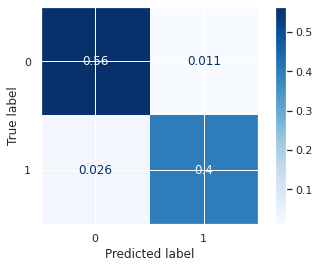

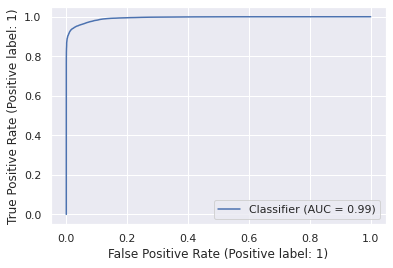

In [ ]:
# Random Forest (Método de ensamble - Bagging)
# creamos modelo base con settings default
model = RandomForestClassifier(class_weight='balanced',random_state=42)
# default
# max_depth: None
# criterion: gini
# n_estimators: 100

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken_rf = time.time()-t0
accuracy_rf = accuracy_score(y_test, y_pred)
roc_auc_rf = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy_rf))
print("ROC Area bajo la Curva = {}".format(roc_auc_rf))
print("Tiempo de Ejecución = {}".format(time_taken_rf))
print(classification_report(y_test,y_pred,digits=5))
# guardo valores roc curve y precision-recall curve
fpr_rf,tpr_rf,thresholds = roc_curve(y_test, y_probs)
precision_rf,recall_rf,thresh = precision_recall_curve(y_test, y_probs)
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()


In [ ]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': 'balanced',
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

### Random Forest - Hyperparameter Tuning

RandomizedSearch

In [ ]:
params_rf = {'criterion':['gini','entropy'],
             'max_depth':np.arange(5,21),
             'n_estimators':[50,100,200]}
             
model = RandomForestClassifier(random_state=42,class_weight='balanced')
randomized_search = RandomizedSearchCV(model, params_rf, n_iter=15, cv=3)
randomized_search.fit(X_train,y_train)

RandomizedSearchCV(cv=3,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    random_state=42),
                   n_iter=15,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]),
                                        'n_estimators': [50, 100, 200]})

In [ ]:
randomized_search.best_params_

{'criterion': 'entropy', 'max_depth': 20, 'n_estimators': 100}

In [ ]:
randomized_search.best_estimator_

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=20, random_state=42)

In [ ]:
randomized_scores = pd.DataFrame(randomized_search.cv_results_)
print(f'Estimadores intentados: {len(randomized_scores)}')
randomized_scores[['rank_test_score','mean_test_score', 'std_test_score','param_max_depth','param_criterion','param_n_estimators','mean_fit_time','std_fit_time']].sort_values('rank_test_score')

Estimadores intentados: 15


,rank_test_score,mean_test_score,std_test_score,param_max_depth,param_criterion,param_n_estimators,mean_fit_time,std_fit_time
3,1,0.959,0.000,20,entropy,100,6.478,0.119
14,2,0.959,0.000,19,gini,200,16.541,0.814
6,3,0.957,0.001,16,gini,50,2.704,0.018
13,4,0.957,0.000,15,entropy,100,9.484,0.448
1,5,0.955,0.000,14,entropy,200,14.942,2.783
2,6,0.955,0.001,14,gini,50,2.652,0.013
12,7,0.954,0.001,13,entropy,200,12.611,1.176
9,8,0.949,0.001,11,entropy,50,4.064,0.186
11,9,0.936,0.001,8,gini,200,7.818,0.030
8,10,0.935,0.000,8,entropy,50,2.025,0.023


Sensibilidad accuracy con max_depth

In [ ]:
param_range= np.arange(5,30)

model = RandomForestClassifier(class_weight='balanced', criterion='entropy',
                        random_state=42,n_estimators=100)

train_scores, test_scores = validation_curve(model, X_train, y_train, 
                                              param_name='max_depth',
                                              param_range=param_range,cv=3)


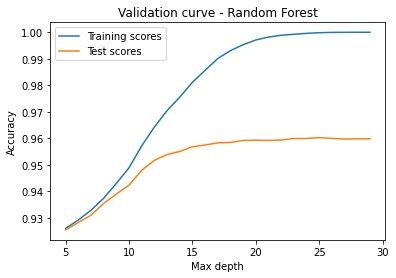

In [ ]:
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(6,6))
plt.plot(param_range,train_scores_mean,label='Training scores')
plt.plot(param_range,test_scores_mean,label='Test scores')

plt.title('Validation curve - Random Forest')
plt.ylabel('Accuracy')
plt.xlabel('Max depth')
plt.legend()
plt.show()

Vemos que a partir de un max_depth de 15 el accuracy del modelo mejora marginalmente y la performance se mantiene estable luego de 20

Elegimos el estimador en base a los resultados del RandomizedSearch

Accuracy = 0.9629774621106202
ROC Area bajo la Curva = 0.9942483934672476
Tiempo de Ejecución = 11.95407748222351
              precision    recall  f1-score   support

           0    0.95790   0.97866   0.96817     20574
           1    0.97022   0.94173   0.95576     15188

    accuracy                        0.96298     35762
   macro avg    0.96406   0.96020   0.96197     35762
weighted avg    0.96313   0.96298   0.96290     35762



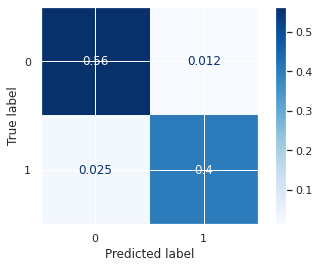

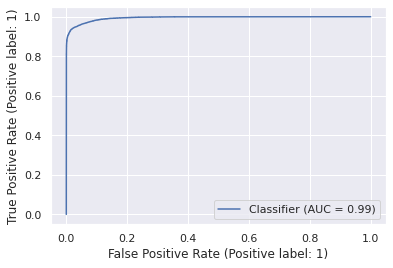

In [ ]:
model = RandomForestClassifier(class_weight='balanced',random_state=42,
                                criterion='entropy',max_depth=20)
# Se observa que el accuracy aumenta con respecto al primero modelo pero es mínimo, 

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken_rf_best = time.time()-t0
accuracy_rf_best = accuracy_score(y_test, y_pred)
roc_auc_rf_best = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy_rf_best))
print("ROC Area bajo la Curva = {}".format(roc_auc_rf_best))
print("Tiempo de Ejecución = {}".format(time_taken_rf_best))
print(classification_report(y_test,y_pred,digits=5))
# guardo valores roc curve y precision-recall curve
fpr_rf_best,tpr_rf_best,thresholds = roc_curve(y_test, y_probs)
precision_rf_best,recall_rf_best,thresh = precision_recall_curve(y_test, y_probs)
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()


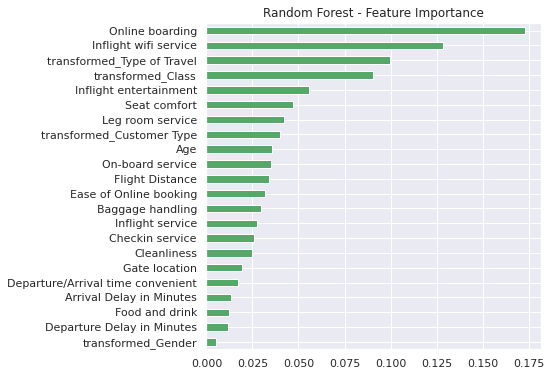

In [ ]:
# importancia de features 
plt.figure(figsize=(6,6))
pd.Series(model.feature_importances_,index=X.columns).sort_values().plot(kind='barh',color='g')
plt.title('Random Forest - Feature Importance')
plt.show()

### Regresión Logistica

Accuracy = 0.8963424864381186
ROC Area bajo la Curva = 0.9626823127261552
Tiempo de Ejecución = 0.8702704906463623
              precision    recall  f1-score   support

           0    0.92747   0.88937   0.90802     20574
           1    0.85804   0.90578   0.88127     15188

    accuracy                        0.89634     35762
   macro avg    0.89275   0.89758   0.89464     35762
weighted avg    0.89798   0.89634   0.89666     35762



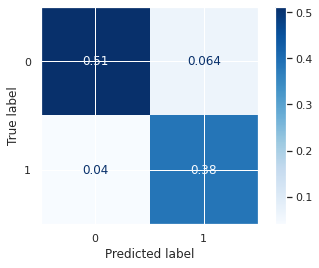

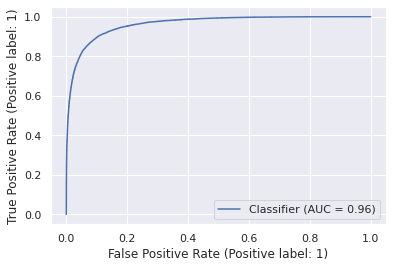

In [ ]:
# creamos modelo base con settings default
model = LogisticRegression(random_state=42,class_weight='balanced') 
# default
# 'l1_ratio': None,
# 'penalty': 'l2',
# 'solver': 'lbfgs',

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken_rl = time.time()-t0
accuracy_rl = accuracy_score(y_test, y_pred)
roc_auc_rl = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy_rl))
print("ROC Area bajo la Curva = {}".format(roc_auc_rl))
print("Tiempo de Ejecución = {}".format(time_taken_rl))
print(classification_report(y_test,y_pred,digits=5))
# guardo valores roc curve y precision-recall curve
fpr_rl,tpr_rl,thresholds = roc_curve(y_test, y_probs)
precision_rl,recall_rl,thresh = precision_recall_curve(y_test, y_probs)
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

In [ ]:
model.get_params()

{'C': 1.0,
 'class_weight': 'balanced',
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 42,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

### Regresión Logística - Hyperparameter Tuning

GridSearch

In [ ]:
params_rl = {'solver': ['newton-cg', 'lbfgs', 'liblinear','saga'],
             'penalty': ['l1', 'l2', 'elasticnet'],
             'l1_ratio': [None,0,0.5,1]}

model = LogisticRegression(random_state=42,class_weight='balanced')
grid_search = GridSearchCV(model, params_rl, cv=3)
grid_search.fit(X_train,y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1479: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  "(penalty={})".format(self.penalty)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1479: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  "(penalty={})".format(self.penalty)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1479: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  "(penalty={})".format(self.penalty)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1479: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l1)
  "(penalty={})".format(self.penalty)
/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:1479: UserWarning: l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penal

GridSearchCV(cv=3,
             estimator=LogisticRegression(class_weight='balanced',
                                          random_state=42),
             param_grid={'l1_ratio': [None, 0, 0.5, 1],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga']})

In [ ]:
grid_search.best_params_

{'l1_ratio': None, 'penalty': 'l1', 'solver': 'saga'}

In [ ]:
grid_search.best_estimator_

LogisticRegression(class_weight='balanced', penalty='l1', random_state=42,
                   solver='saga')

In [ ]:
# best 10 estimators 
grid_scores = pd.DataFrame(grid_search.cv_results_)
print('TOP 10 estimadores')
grid_scores[['rank_test_score','mean_test_score', 'std_test_score','param_l1_ratio','param_penalty','param_solver','mean_fit_time','std_fit_time']].sort_values('rank_test_score').head(10)


TOP 10 estimadores


,rank_test_score,mean_test_score,std_test_score,param_l1_ratio,param_penalty,param_solver,mean_fit_time,std_fit_time
47,1,0.895,0.001,1,elasticnet,saga,1.959,0.471
3,1,0.895,0.001,None,l1,saga,1.972,0.466
27,1,0.895,0.001,0.500,l1,saga,1.867,0.435
39,1,0.895,0.001,1,l1,saga,1.811,0.412
15,1,0.895,0.001,0,l1,saga,1.891,0.380
35,6,0.895,0.001,0.500,elasticnet,saga,1.902,0.450
18,7,0.895,0.001,0,l2,liblinear,0.441,0.004
19,7,0.895,0.001,0,l2,saga,1.687,0.380
28,7,0.895,0.001,0.500,l2,newton-cg,0.793,0.012
29,7,0.895,0.001,0.500,l2,lbfgs,0.328,0.021


Elegimos el estimador en base a los resultados del RandomizedSearch

Vemos que el accuracy y AUC no cambian significativamente con respecto al modelo base

Accuracy = 0.8963984117219395
ROC Area bajo la Curva = 0.9626816438788801
Tiempo de Ejecución = 2.62044358253479
              precision    recall  f1-score   support

           0    0.92752   0.88942   0.90807     20574
           1    0.85811   0.90585   0.88133     15188

    accuracy                        0.89640     35762
   macro avg    0.89281   0.89764   0.89470     35762
weighted avg    0.89804   0.89640   0.89671     35762



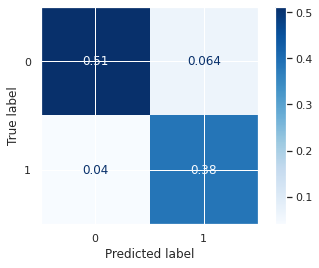

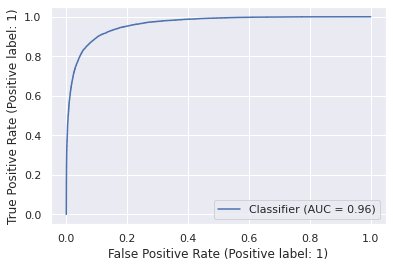

In [ ]:
# Fit - Predict - Scores
model = LogisticRegression(class_weight='balanced', penalty='l1', random_state=42,
                   solver='saga')

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken_rl_best = time.time()-t0
accuracy_rl_best = accuracy_score(y_test, y_pred)
roc_auc_rl_best = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy_rl_best))
print("ROC Area bajo la Curva = {}".format(roc_auc_rl_best))
print("Tiempo de Ejecución = {}".format(time_taken_rl_best))
print(classification_report(y_test,y_pred,digits=5))
# guardo valores roc curve y precision-recall curve
fpr_rl_best,tpr_rl_best,thresholds = roc_curve(y_test, y_probs)
precision_rl_best,recall_rl_best,thresh = precision_recall_curve(y_test, y_probs)
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()


### LightGBM

Accuracy = 0.9633409764554555
ROC Area bajo la Curva = 0.9950627134246852
Tiempo de Ejecución = 5.130093097686768
              precision    recall  f1-score   support

           0    0.96161   0.97521   0.96836     20574
           1    0.96576   0.94726   0.95642     15188

    accuracy                        0.96334     35762
   macro avg    0.96369   0.96124   0.96239     35762
weighted avg    0.96337   0.96334   0.96329     35762



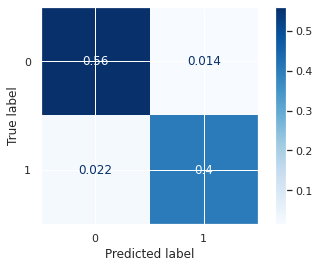

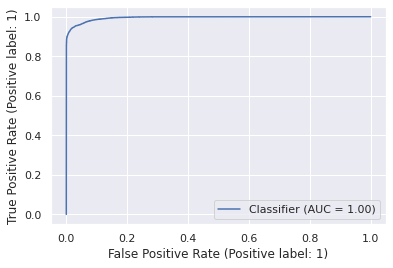

In [ ]:
# LIGHTGBM (Método de ensamble - Boosting)

# creamos modelo base con settings default
model = lgb.LGBMClassifier(class_weight='balanced',random_state = 42) 
# default
# 'max_depth': -1,
# 'n_estimators': 100,
# 'learning_rate': 0.1,

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken_lgbm = time.time()-t0
accuracy_lgbm = accuracy_score(y_test, y_pred)
roc_auc_lgbm = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy_lgbm))
print("ROC Area bajo la Curva = {}".format(roc_auc_lgbm))
print("Tiempo de Ejecución = {}".format(time_taken_lgbm))
print(classification_report(y_test,y_pred,digits=5))
# guardo valores roc curve y precision-recall curve
fpr_lgbm,tpr_lgbm,thresholds = roc_curve(y_test, y_probs)
precision_lgbm,recall_lgbm,thresh = precision_recall_curve(y_test, y_probs)
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

In [ ]:
model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': 'balanced',
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'num_leaves': 31,
 'objective': None,
 'random_state': 42,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'silent': True,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

### LightGBM - Hyperparameter Tuning

GridSearch

In [ ]:
params_lgbm = {'max_depth': [-1,5,10,15,20],
              'n_estimators':[50,100,200],
              'learning_rate':np.arange(0.1,0.5,0.1)}

model = lgb.LGBMClassifier(class_weight='balanced',random_state = 42)
grid_search = GridSearchCV(model, params_lgbm, cv=3)
grid_search.fit(X_train,y_train)

GridSearchCV(cv=3,
             estimator=LGBMClassifier(class_weight='balanced', random_state=42),
             param_grid={'learning_rate': array([0.1, 0.2, 0.3, 0.4]),
                         'max_depth': [-1, 5, 10, 15, 20],
                         'n_estimators': [50, 100, 200]})

In [ ]:
grid_search.best_params_

{'learning_rate': 0.1, 'max_depth': 20, 'n_estimators': 200}

In [ ]:
grid_search.best_estimator_

LGBMClassifier(class_weight='balanced', max_depth=20, n_estimators=200,
               random_state=42)

In [ ]:
# best 5 estimators 
grid_scores = pd.DataFrame(grid_search.cv_results_)
grid_scores[['rank_test_score','mean_test_score', 'std_test_score','param_max_depth','param_learning_rate','param_n_estimators','mean_fit_time','std_fit_time']].sort_values('rank_test_score').head()


,rank_test_score,mean_test_score,std_test_score,param_max_depth,param_learning_rate,param_n_estimators,mean_fit_time,std_fit_time
14,1,0.963,0.000,20,0.100,200,3.721,1.332
2,2,0.963,0.000,-1,0.100,200,6.366,2.064
11,3,0.962,0.000,15,0.100,200,1.910,0.007
8,4,0.962,0.000,10,0.100,200,3.101,1.287
7,5,0.962,0.001,10,0.100,100,2.757,0.155


Dentro del TOP 5 vemos que dentro del rango de n_estimadores que analizamos, prefirio 200 ante 100, con distintos niveles de max_depth y un learning rate de 0.1 

Sensibilidad accuracy con max_depth

In [ ]:
param_range= np.arange(10,31)

model = lgb.LGBMClassifier(class_weight='balanced', learning_rate=0.1, n_estimators=200, random_state=42)

train_scores, test_scores = validation_curve(model, X_train, y_train, 
                                              param_name='max_depth',
                                              param_range=param_range,cv=3)

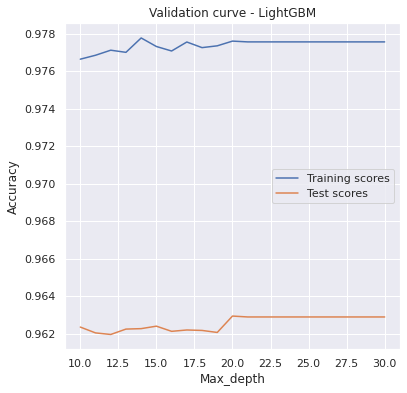

In [ ]:
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(6,6))
plt.plot(param_range,train_scores_mean,label='Training scores')
plt.plot(param_range,test_scores_mean,label='Test scores')

plt.title('Validation curve - LightGBM')
plt.ylabel('Accuracy')
plt.xlabel('Max_depth')
plt.legend()
plt.show()

Vemos que el rango de accuracy entre max_depth 10 y 30 se encuentre entre 0.962 y aprox. 0.963 con un pico en max_depth=20 

Sensibilidad accuracy con n_estimators

In [ ]:
param_range=[50,100,200,500,750]

model = lgb.LGBMClassifier(class_weight='balanced', learning_rate=0.1, max_depth=20, random_state=42)

train_scores, test_scores = validation_curve(model, X_train, y_train, 
                                              param_name='n_estimators',
                                              param_range=param_range,cv=3)

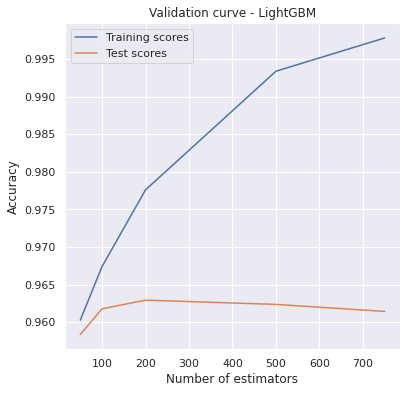

In [ ]:
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(6,6))
plt.plot(param_range,train_scores_mean,label='Training scores')
plt.plot(param_range,test_scores_mean,label='Test scores')

plt.title('Validation curve - LightGBM')
plt.ylabel('Accuracy')
plt.xlabel('Number of estimators')
plt.legend()
plt.show()

Elegimos el estimador en base a los resultados del GridSearch

Accuracy = 0.9653822493149152
ROC Area bajo la Curva = 0.9954933006592798
Tiempo de Ejecución = 3.290117025375366
              precision    recall  f1-score   support

           0    0.96325   0.97711   0.97013     20574
           1    0.96837   0.94950   0.95884     15188

    accuracy                        0.96538     35762
   macro avg    0.96581   0.96330   0.96449     35762
weighted avg    0.96542   0.96538   0.96534     35762



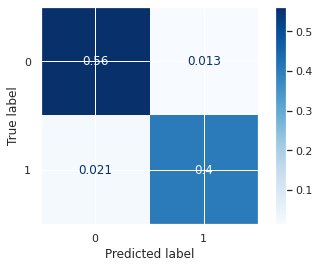

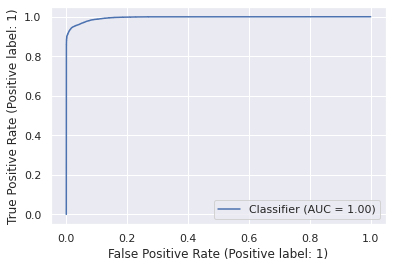

In [ ]:
model = lgb.LGBMClassifier(class_weight='balanced',random_state=42,
                           max_depth=20,n_estimators=200,learning_rate=0.1) 

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken_lgbm_best = time.time()-t0
accuracy_lgbm_best = accuracy_score(y_test, y_pred)
roc_auc_lgbm_best = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy_lgbm_best))
print("ROC Area bajo la Curva = {}".format(roc_auc_lgbm_best))
print("Tiempo de Ejecución = {}".format(time_taken_lgbm_best))
print(classification_report(y_test,y_pred,digits=5))
# guardo valores roc curve y precision-recall curve
fpr_lgbm_best,tpr_lgbm_best,thresholds = roc_curve(y_test, y_probs)
precision_lgbm_best,recall_lgbm_best,thresh = precision_recall_curve(y_test, y_probs)
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

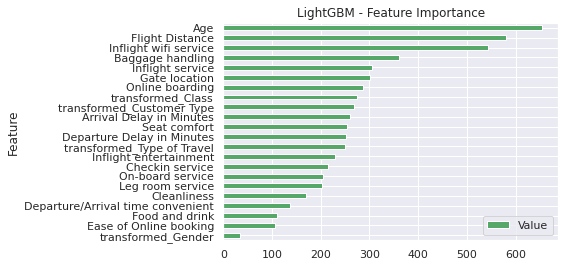

In [ ]:
# importancia de features según cantidad de veces que se utilizó el feature en el modelo
pd.DataFrame({'Value':model.feature_importances_,'Feature':X.columns.values}).sort_values(by="Value").plot(x='Feature',kind='barh',color='g')
plt.title('LightGBM - Feature Importance')
plt.show()

### Comparaciones Entre los Modelos


Modelos Base

In [ ]:
auc_scores = [roc_auc_dt, roc_auc_rl, roc_auc_rf,roc_auc_lgbm]
acc_scores=[accuracy_dt,accuracy_rl,accuracy_rf,accuracy_lgbm]
time_scores=[time_taken_dt, time_taken_rl, time_taken_rf,time_taken_lgbm]

model_scores = pd.DataFrame(list(zip(auc_scores,acc_scores,time_scores)), index=['Decision Tree','Regresión Logistica','Random Forest','LightGBM'], columns=['AUC','Accuracy','Time'])
model_scores

,AUC,Accuracy,Time
Decision Tree,0.948,0.948,0.608
Regresión Logistica,0.963,0.896,0.870
Random Forest,0.994,0.963,10.664
LightGBM,0.995,0.963,5.130


Modelos con Hypertuning

In [ ]:
auc_scores = [roc_auc_dt_best, roc_auc_rl_best, roc_auc_rf_best,roc_auc_lgbm_best]
acc_scores=[accuracy_dt_best,accuracy_rl_best,accuracy_rf_best,accuracy_lgbm_best]
time_scores=[time_taken_dt_best, time_taken_rl_best, time_taken_rf_best,time_taken_lgbm_best]

model_scores = pd.DataFrame(list(zip(auc_scores,acc_scores,time_scores)), index=['Decision Tree','Regresión Logistica','Random Forest','LightGBM'], columns=['AUC','Accuracy','Time'])
model_scores


,AUC,Accuracy,Time
Decision Tree,0.978,0.953,0.793
Regresión Logistica,0.963,0.896,2.620
Random Forest,0.994,0.963,11.954
LightGBM,0.995,0.965,3.290


ROC Curves

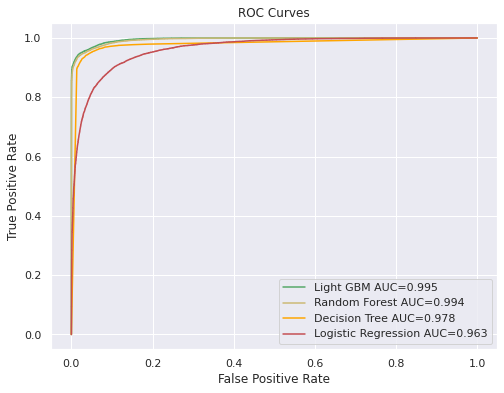

In [ ]:
# ROC Curve
# True Positive Rate = True Positives / (True Positives + False Negatives) [Sensitivity]
# False Positive Rate = False Positives / (False Positives + True Negatives) [1 - Specificity]

plt.figure(figsize=(8,6))
plt.plot(fpr_lgbm_best,tpr_lgbm_best,color='g',label="Light GBM AUC="+str(round(roc_auc_lgbm_best,3)))
plt.plot(fpr_rf_best,tpr_rf_best,color='y',label="Random Forest AUC="+str(round(roc_auc_rf_best,3)))
plt.plot(fpr_dt_best,tpr_dt_best,color='orange',label="Decision Tree AUC="+str(round(roc_auc_dt_best,3)))
plt.plot(fpr_rl_best,tpr_rl_best,color='r',label="Logistic Regression AUC="+str(round(roc_auc_rl_best,3)))
plt.title('ROC Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

Precision-Recall Curves

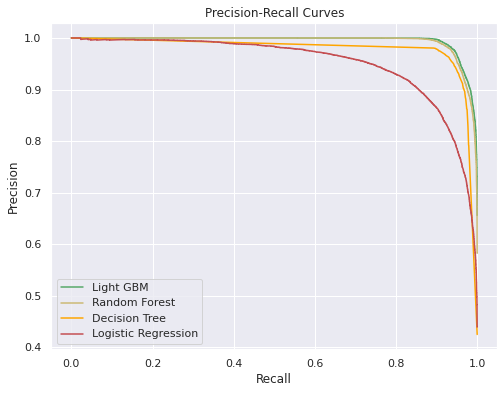

In [ ]:
# Precision-Recall Curve
# Precision = True Positives / (True Positives + False Positives) [Positive Predictive Power]
# Recall = True Positives / (True Positives + False Negatives) [Sensitivity]

plt.figure(figsize=(8,6))
plt.plot(recall_lgbm_best,precision_lgbm_best,color='g',label="Light GBM")
plt.plot(recall_rf_best,precision_rf_best,color='y',label="Random Forest")
plt.plot(recall_dt_best,precision_dt_best,color='orange',label="Decision Tree")
plt.plot(recall_rl_best,precision_rl_best,color='r',label="Logistic Regression")
plt.title('Precision-Recall Curves')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()

Validación Cruzada

Si bien en la elección de los modelos mediante métodos como GridSearch o RandomizedSearch se utilizó validación cruzada, lo implementamos para comparar el performance de los cuatro mejores modelos.  

In [ ]:
model = lgb.LGBMClassifier(class_weight='balanced',random_state=42,
                           max_depth=20,n_estimators=200,learning_rate=0.1) 
cvscores_lgbm_best = cross_val_score(model,X_train,y_train,cv=5)

model = RandomForestClassifier(class_weight='balanced',random_state=42,
                                criterion='entropy',max_depth=20)
cvscores_rf_best = cross_val_score(model,X_train,y_train,cv=5)

model = DecisionTreeClassifier(class_weight='balanced', criterion='entropy', 
                               max_depth=16, random_state=42)
cvscores_dt_best = cross_val_score(model,X_train,y_train,cv=5)

model = LogisticRegression(class_weight='balanced', penalty='l1', random_state=42,
                   solver='saga')
cvscores_rl_best = cross_val_score(model,X_train,y_train,cv=5)

In [ ]:
print('LightGBM')
print(f'Promedio:{round(np.mean(cvscores_lgbm_best),3)} - Desvío estándar:{round(np.std(cvscores_lgbm_best),3)}')
print('Random Forest')
print(f'Promedio:{round(np.mean(cvscores_rf_best),3)} - Desvío estándar:{round(np.std(cvscores_rf_best),3)}')
print('Decision Tree')
print(f'Promedio:{round(np.mean(cvscores_dt_best),3)} - Desvío estándar:{round(np.std(cvscores_dt_best),3)}')
print('Regresión Logistica')
print(f'Promedio:{round(np.mean(cvscores_rl_best),3)} - Desvío estándar:{round(np.std(cvscores_rl_best),3)}')


LightGBM
Promedio:0.963 - Desvío estándar:0.002
Random Forest
Promedio:0.96 - Desvío estándar:0.002
Decision Tree
Promedio:0.95 - Desvío estándar:0.002
Regresión Logistica
Promedio:0.895 - Desvío estándar:0.002


#Comentarios sobre los Datos

**Del analisis Univariado podemos decir:**
* En cuanto a satisfacción (nuestra variable a predecir) En un (56%) la opinión en satisfacción fue Neutral o negativa, versus 44% donde los clientes quedaron satisfechos. **No hay desbalance de la variable target.**
*   Variable genero: La proporción de hombres y mujeres encuestados es similar.
*   Segun histograma por edad, el rango de más concentración es entre 25-60 años.
*   Respecto a las clases: Es menor al 10% las personas que viajan en ecoplus, el resto se dividide entre business y eco en partes prácticamente iguales. Es probable que la oferta de ecoplus no este disponible en muchos vuelos, y no que sea por una preferencia del cliente.
* De los gráficos de torta evaluando las encuestas, vemos que hay más exigencia (o menos conformidad) en wifi en vuelo y en facilidad de reserva on line. 

**Sobre el Análisis Bivariado:**
* Por lo visto en el gráfico de cajas, los clientes de business tienen un promedio de edad más elevado (+33 a 50) que quienes viajan en las otras dos (+25 a 50)
* Observando el gráfico de violin(distancia/satisfacción), los clientes que realizan viajes cortos (menores a 1000 km) tienden a tener un nivel de satisfacción neutral o negativa.
Esta No Satisfacción, puede tener que ver con otra variable que se relacione con viajes cortos más que con la distancia en si misma. (Por ejemplo la clase ,edad o tipo de viaje) Es conveniente evaluar distancia/variable?/satisfacción en gráficos multivariados.

Podemos ver una tabla posterior a dicho gráfico donde indica que los que viajan en clase eco en su mayoria son No satisfechos y los que viajan en clase business en mayoria son Satisfechos. También más adelante se ve en gráfico violin (Clase/distancia/satisfacción) que los viajes cortos poseen mayor concentración en clase eco, lo que explica una de las causas porque en viajes cortos hay menor grado de satisfacción.

Siguiendo con la misma idea, vemos en las tablas siguientes que los que viajan por motivos personales en su gran mayoria son No satisfechos, y viajan distancias más cortas que los que viajan por trabajo.

**Observación Multivariada**
* La demora en la partida tiene una correlación positiva muy fuerte con la demora en la llegada (r= 0,96), sin embargo no afecta el nivel de satisfacción de los pasajeros. 
* Un cliente no leal es más probable que sea No satisfecho.
* Observando gráfico violin (genero/edad/satisfacción) los No satisfechos poseen entre 20 a 40 años (los conformes poseen entre 40 a 60).
*Del mapa de calor (satisfacción/clase/encuestas) vemos que
Los satisfechos que viajaron en business, le dieron importancia a los asientos y al servicio en vuelo. Mientras que los que los satisfechos que viajaron en economica le dieron importancia al wifi y a los entretenimientos. (Dato importante para el cliente, donde fortalecer en cada clase) Se observa mediante este mapa que los No Satisfechos de todas las clases puntuaron en promedio bajo al servicio de wifi en vuelo.


---
De acuerdo a nuestro gráfico de correlación, observamos que aquellas variables que mayor correlación lineal con la satisfación de los pasajeros corresponden a 



1.   Online Boarding
2.   Class
3.   Type of Travel

Mientras aquellas que peor correlación lineal tienen con la variable de satisfacción son: 



*   Gate Location
*   Gender
*   Departure/Arrival Time Conveninet

**Del gráfico FacetGrid - (Edad vs Distancia segun clase)**
Se pueden ver zonas y franjas de las clases y edad. Esto permitiría hacer  clustering y segmentar patrones para repensar estrategias de mercado.

# Comentarios sobre los Modelos

1. Los modelos base ya cuentan con un buen performance, el hypertuning no logra mejoras significativas, ej: una mejora de Accuracy de 0.005 en Decision Tree.

2. Regresión logística no presentó una buena performance para este caso (Accuracy 89%) en comparación con nuestro modelo más simple: Decision Tree (Accuracy 95.3%).
3. Los dos modelos de mejores resultados fueron los modelos ensamblados: tanto por el método de bagging (Random Forest) con 96.3% como por el método de boosting (LightGBM) con 96.5%.
4. El modelo puede tener dos errores de predicción en nuestro caso: predice que el cliente no está satisfecho cuando en verdad si lo está, o predice que el cliente sí está satisfecho cuando en verdad no lo está. Si tuvieramos una aversión mayor a este último error entonces se elegirá el modelo que lo minimice: 
(Random Forest 1.2% - LightGBM 1.3% - Decision Tree 2.4% - Regresión Logística 6.4%)
5. Si se elige estrictamente según las métricas de Accuracy y Area Under the Curve, entonces el mejor clasificador es: 
LightGBM con 96.5% y 99.5% respectivamente.

# Mejoras al modelo

### PCA

Probamos realizando PCA a los features

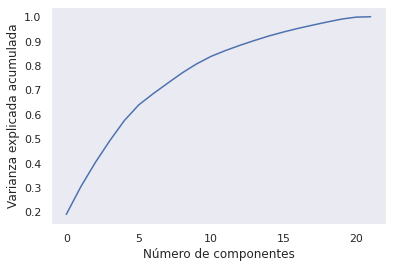

In [ ]:
# utilizamos los features normalizados X_normalized 

# buscamos el ratio (Varianza explicada vs Número de componentes)
pca = PCA()
pca.fit(X_normalized)
# Explained variance ratio
exp_var_ratio = pca.explained_variance_ratio_
# Cumulative sum of the variance ratios
cumsum = np.cumsum(exp_var_ratio)
# grafico
plt.plot(cumsum)
plt.xlabel('Número de componentes')
plt.ylabel('Varianza explicada acumulada')
plt.grid()

In [ ]:
# Probamos con 5 componentes

In [ ]:
pca = PCA(n_components=5,random_state=42)
X_pca = pca.fit_transform(X_normalized)

In [ ]:
print(f'Shape de dataset original:{X.shape}\nShape de dataset con PCA:{X_pca.shape}')

Shape de dataset original:(119204, 22)
Shape de dataset con PCA:(119204, 5)


In [ ]:
pca.explained_variance_ratio_

array([0.19044988, 0.11316826, 0.09916323, 0.08943781, 0.08223555])

In [ ]:
np.sum(pca.explained_variance_ratio_)

0.5744547261465267

In [ ]:
#Me quedo con 30% para test y 70% para train
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.3, random_state=42) 

Accuracy = 0.9053184944913596
ROC Area bajo la Curva = 0.9684488739159265
Tiempo de Ejecución = 1.9643268585205078
              precision    recall  f1-score   support

           0    0.92268   0.91183   0.91722     20574
           1    0.88244   0.89650   0.88941     15188

    accuracy                        0.90532     35762
   macro avg    0.90256   0.90416   0.90332     35762
weighted avg    0.90559   0.90532   0.90541     35762



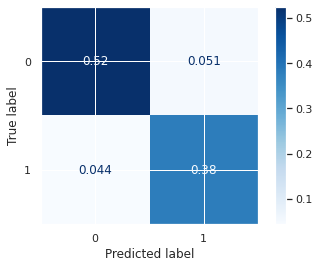

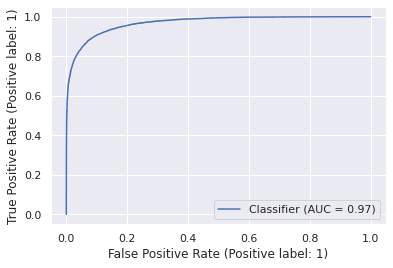

In [ ]:
# utilizo mejor LightGBM para ver si hay mejora
model = lgb.LGBMClassifier(class_weight='balanced',random_state=42,max_depth=20,n_estimators=200,learning_rate=0.1) 

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken = time.time()-t0
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy))
print("ROC Area bajo la Curva = {}".format(roc_auc))
print("Tiempo de Ejecución = {}".format(time_taken))
print(classification_report(y_test,y_pred,digits=5))
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

In [ ]:
# Probamos con 10 componentes

In [ ]:
pca = PCA(n_components=10,random_state=42)
X_pca = pca.fit_transform(X_normalized)

In [ ]:
print(f'Shape de dataset original:{X.shape}\nShape de dataset con PCA:{X_pca.shape}')

Shape de dataset original:(119204, 22)
Shape de dataset con PCA:(119204, 10)


In [ ]:
pca.explained_variance_ratio_

array([0.19044988, 0.11316827, 0.09916323, 0.08943784, 0.08223556,
       0.0645419 , 0.04612716, 0.04291744, 0.04223988, 0.03690426])

In [ ]:
np.sum(pca.explained_variance_ratio_)

0.8071854202504827

In [ ]:
#Me quedo con 30% para test y 70% para train
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.3, random_state=42) 

Accuracy = 0.9322744812929925
ROC Area bajo la Curva = 0.9827689036785423
Tiempo de Ejecución = 5.976301908493042
              precision    recall  f1-score   support

           0    0.94412   0.93779   0.94094     20574
           1    0.91648   0.92481   0.92063     15188

    accuracy                        0.93227     35762
   macro avg    0.93030   0.93130   0.93078     35762
weighted avg    0.93238   0.93227   0.93231     35762



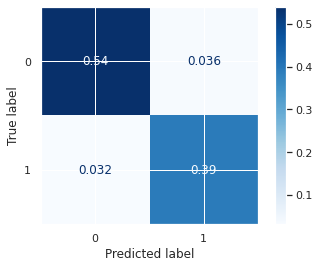

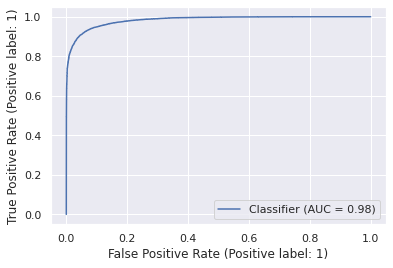

In [ ]:
# utilizo mejor LightGBM para ver si hay mejora
model = lgb.LGBMClassifier(class_weight='balanced',random_state=42,max_depth=20,n_estimators=200,learning_rate=0.1) 

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken = time.time()-t0
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy))
print("ROC Area bajo la Curva = {}".format(roc_auc))
print("Tiempo de Ejecución = {}".format(time_taken))
print(classification_report(y_test,y_pred,digits=5))
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

## Feature selection

Probamos realizar feature selection con tres técnicas distintas: Variance Threshold, SelectKBest y SelectFromModel

Variance Threshold

In [ ]:
selector = VarianceThreshold(threshold=0.5) 
X_transformed = selector.fit_transform(X)

In [ ]:
print(f'Shape de dataset original:{X.shape}\nShape de dataset con transformación:{X_transformed.shape}')

Shape de dataset original:(119204, 22)
Shape de dataset con transformación:(119204, 19)


In [ ]:
#Me quedo con 30% para test y 70% para train
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.3, random_state=42) 

Accuracy = 0.9524075834684861
ROC Area bajo la Curva = 0.9925122547541857
Tiempo de Ejecución = 3.6733322143554688
              precision    recall  f1-score   support

           0    0.95797   0.95937   0.95867     20574
           1    0.94485   0.94298   0.94391     15188

    accuracy                        0.95241     35762
   macro avg    0.95141   0.95117   0.95129     35762
weighted avg    0.95240   0.95241   0.95240     35762



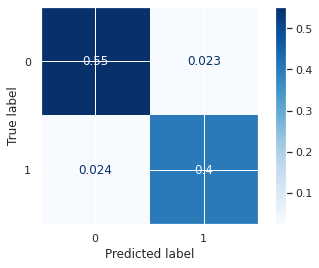

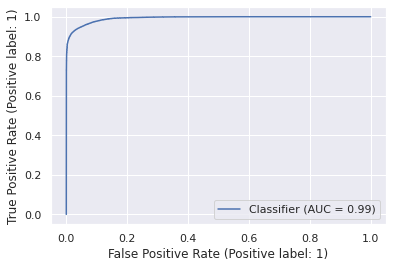

In [ ]:
# utilizo mejor LightGBM para ver si hay mejora
model = lgb.LGBMClassifier(class_weight='balanced',random_state=42,max_depth=20,n_estimators=200,learning_rate=0.1) 

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken = time.time()-t0
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy))
print("ROC Area bajo la Curva = {}".format(roc_auc))
print("Tiempo de Ejecución = {}".format(time_taken))
print(classification_report(y_test,y_pred,digits=5))
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

Select K Best

In [ ]:
X_transformed = SelectKBest(chi2, k=10).fit_transform(X, y)

In [ ]:
print(f'Shape de dataset original:{X.shape}\nShape de dataset con transformación:{X_transformed.shape}')

Shape de dataset original:(119204, 22)
Shape de dataset con transformación:(119204, 10)


In [ ]:
#Me quedo con 30% para test y 70% para train
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.3, random_state=42) 

Accuracy = 0.9363290643700016
ROC Area bajo la Curva = 0.9857384031675174
Tiempo de Ejecución = 3.7593648433685303
              precision    recall  f1-score   support

           0    0.94651   0.94260   0.94455     20574
           1    0.92267   0.92784   0.92525     15188

    accuracy                        0.93633     35762
   macro avg    0.93459   0.93522   0.93490     35762
weighted avg    0.93639   0.93633   0.93635     35762



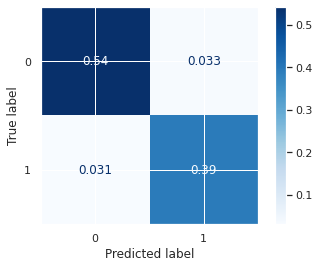

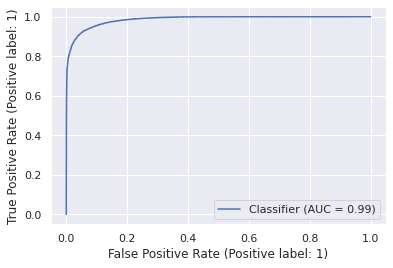

In [ ]:
# utilizo mejor LightGBM para ver si hay mejora
model = lgb.LGBMClassifier(class_weight='balanced',random_state=42,max_depth=20,n_estimators=200,learning_rate=0.1) 

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken = time.time()-t0
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy))
print("ROC Area bajo la Curva = {}".format(roc_auc))
print("Tiempo de Ejecución = {}".format(time_taken))
print(classification_report(y_test,y_pred,digits=5))
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

Select From Model

In [ ]:
# utilizo el mejor modelo LightGBM
model = lgb.LGBMClassifier(class_weight='balanced',random_state=42,max_depth=20,n_estimators=200,learning_rate=0.1) 

selector = SelectFromModel(estimator=model).fit(X_normalized, y)

In [ ]:
X_transformed = selector.transform(X_normalized)

In [ ]:
print(f'Shape de dataset original:{X.shape}\nShape de dataset con transformación:{X_transformed.shape}')

Shape de dataset original:(119204, 22)
Shape de dataset con transformación:(119204, 10)


In [ ]:
# Los 10 features que selecciona 
selector.get_feature_names_out(X.columns)

array(['Age', 'Flight Distance', 'Inflight wifi service',
       'Online boarding', 'Seat comfort', 'Baggage handling',
       'Inflight service', 'transformed_Customer Type',
       'transformed_Type of Travel', 'transformed_Class'], dtype=object)

In [ ]:
#Me quedo con 30% para test y 70% para train
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.3, random_state=42) 

Se observa que utilizando el método SelectFromModel pasamos de 22 features a un dataset con 10 features y nuestro Accuracy disminuyo solamente de 0.9653 a 0.9555 y el AUC de 0.9954 a 0.9925

Accuracy = 0.9555393993624518
ROC Area bajo la Curva = 0.9925773041519812
Tiempo de Ejecución = 4.857831716537476
              precision    recall  f1-score   support

           0    0.95403   0.96943   0.96167     20574
           1    0.95766   0.93673   0.94708     15188

    accuracy                        0.95554     35762
   macro avg    0.95585   0.95308   0.95437     35762
weighted avg    0.95557   0.95554   0.95547     35762



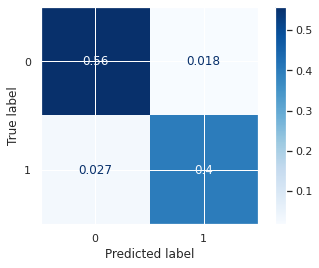

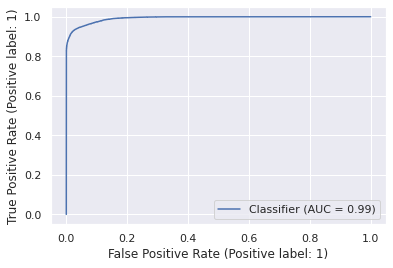

In [ ]:
# utilizo mejor LightGBM para ver si hay mejora
model = lgb.LGBMClassifier(class_weight='balanced',random_state=42,max_depth=20,n_estimators=200,learning_rate=0.1) 

########## Fit - Predict - Scores
t0=time.time()
# fit del modelo
model.fit(X_train,y_train.ravel())
# prediccion
y_pred = model.predict(X_test)
# probabilidades de las predicciones
y_probs = model.predict_proba(X_test)[:, 1]
# guardo valores
time_taken = time.time()-t0
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test,y_probs)
print("Accuracy = {}".format(accuracy))
print("ROC Area bajo la Curva = {}".format(roc_auc))
print("Tiempo de Ejecución = {}".format(time_taken))
print(classification_report(y_test,y_pred,digits=5))
# graficar confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred,cmap='Blues',normalize='all')
# graficar roc curve
RocCurveDisplay.from_predictions(y_test, y_probs)
plt.show()

## Otras pruebas realizadas

*   Se realizó balanceo del target transformando el dataset, siendo 50% (satisfechos) y 50% (no satisfechos/neutrales) realizando una disminución de los registros mediante muestra aleatoria sin reemplazo pero en una prueba con el mejor modelo LightGBM observamos que el performance no mejoró. 
*   Se realizó una transformación de las variables "Age" y "Flight Distance":

En Age se convirtió la edad en un rango <18  menores, 18-30 joven, 30-45 joven-adulto, 45-60 adulto y >60 mayores. De esta forma convirtiendola en dummy.

En Flight Distance se convirtió la distancia de kilómetros a horas utilizando un promedio de km/hs para luego discriminar entre la duración del viaje: vuelo corto <= 3 hs, vuelo medio 3 y 8 hs y finalmente vuelo largo > 8 hs. También se la convierte en dummy.

Se realizo una pruba con el mejor modelo LightGBM realizando la transformación de las variables (así como cada una por separado) y no se observó una mejora en el performance.

* Originalmente se probó tomando como valor 0, el valor nulo o NA de las encuestas, luego en el modelo final como se muestra en este proyecto, se quitaron esos registros, la performance mejoró levemente. 

* Tambien se probaron diversos algoritmos de ensamble donde no se notaron mejoras en la clasificación y se optó por lightGBM que fue el que mejor resultados dio.

# Futuras líneas



* Durante el trabajo encontramos la dificultad de mejorar tanto el Accuracy como el AUC, se intentaron distintos métodos pero no fueron satisfactorios. No se supera el nivel de Accuracy de 0.965 y AUC 0.995. Creemos que un análisis más exhaustivo de feature engineering quizás pueda superar esa barrera.     
